# Convolutional Neural Network
This notebook will use a deep supervised learning model known as a convolutional neural network. These techniques serve as the foundation for modern computer vision. A variety of deep learning frameworks are available out there, but we will use *PyTorch* in this project:

In [1]:
%pip install torch torchvision torchsummary

Note: you may need to restart the kernel to use updated packages.


After installing, we can import the *PyTorch* libraries and other peripherals:

In [2]:
import pandas as pd
import numpy as np
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torch
import rasterio

from torch.utils.data import Dataset, DataLoader, Subset, random_split, WeightedRandomSampler
from torchvision import models
from torchsummary import summary
from sklearn.model_selection import KFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score, ConfusionMatrixDisplay
from tqdm import tqdm
from collections import Counter

We will now see if the current host has an available GPU to train our model:

In [3]:
if torch.cuda.is_available():
    device = torch.device('cuda')
    print(torch.cuda.get_device_properties(device))

_CudaDeviceProperties(name='NVIDIA GeForce GTX 1650 SUPER', major=7, minor=5, total_memory=4095MB, multi_processor_count=20, uuid=a8a5cc4f-2e00-71f1-09ec-e8f5e0990a00, pci_bus_id=43, pci_device_id=0, pci_domain_id=0, L2_cache_size=1MB)


The output above indicates that the system has a NVIDIA GeForce GTX 1650 SUPER GPU with only 4 GB of VRAM. This means we have to optimize our training for a fairly weak graphics card. Next, we load the ground truths containing probabilities and verify that each row sums to 1:

In [4]:
df = pd.read_csv("ground_truths.csv")
y = df.to_numpy(dtype=np.float32)
np.allclose(y.sum(axis=1), 1.0)

True

$\mathbf{y}$ contains soft label vectors for each tile:

$$
\vec{y_i} = \begin{bmatrix}
    p^{(i)}_\text{urban} \\
    p^{(i)}_\text{rural} \\
    p^{(i)}_\text{uninhabited}
\end{bmatrix} \in \mathbb{R}^3, \quad \vec{y_i} \in \Delta^2,
$$

where $\Delta^{K-1}$ is the probability simplex: $\sum_{k=1}^K y_{i,k} = 1$. Now, we define a *PyTorch* `Dataset` mapping $\mathcal{D} : i \mapsto (\mathbf{x}_i, \vec{y_i}),$ where $\mathbf{x}_i \in \mathbb{R}^{3 \times 256 \times 256}$ is a RGB tensor for training. The following steps describe $\mathcal{D}$:
1. Using `rasterio`, we load the raw tile from disk into $\mathbf{X}^{\text{raw}}_i \in \mathbb{R}^{3 \times H \times W}$ where $H \times W$ are the original spatial dimensions of the tile.
2. We normalize to $[0, 1]$:

$$
\mathbf{x}^\text{norm}_i = \frac{\mathbf{X}^{\text{raw}}_i}{255} \in [0, 1]^{3 \times H \times W}.
$$

3. Finally, resize to a fixed input shape using bilinear interpolation:

$$
\mathbf{x}_i = \text{resize}(\mathbf{x}^\text{norm}_i) \in \mathbb{R}^{3 \times 256 \times 256}.
$$

This completes the mapping of $\mathcal{D}$. The implementation steps are shown below:

In [5]:
class TilesDataset(Dataset):
    def __init__(self, labels, indices=None, resize=(256, 256)):
        self.labels = labels
        self.resize = resize
        self.indices = np.arange(len(labels)) if indices is None else np.array(indices)

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, i):
        idx = self.indices[i]

        with rasterio.open(f"HLS2-s30_rgb/tile{idx}.tif") as src:
            img = src.read().astype(np.float32) / 255.0  # 3 x H x W

        img = torch.from_numpy(img)
        img = F.interpolate(img.unsqueeze(0), size=self.resize, mode='bilinear', align_corners=False).squeeze(0)
        label = torch.tensor(self.labels[idx], dtype=torch.float32)
        return img, label

Let the batch size be $B$. The `DataLoader` selects a set of indices
$$
\mathcal{I}_\text{batch} = \{i_1, i_2, ..., i_B\} \subseteq [0, 30443].
$$

Then the batch tensors are

$$
\mathbf{X}_\text{batch} = \mathbf{x}[\mathcal{I}_\text{batch}] \in \mathbb{R}^{B \times 3 \times 256 \times 256},
$$$$
\mathbf{Y}_\text{batch} = \mathbf{y}[\mathcal{I}_\text{batch}] \in \mathbb{R}^{B \times 3}.
$$

Over an entire epoch,

$$
\mathcal{D} = \bigcup_{t=0}^{\lceil 30444 / B \rceil - 1} (\mathbf{X}^{(t)}_\text{batch}, \mathbf{Y}^{(t)}_\text{batch}).
$$

Now, we move on to model selection and description. There are many CNNs in *PyTorch* but we will use **ResNet-34** due to hardware constraints of the GTX 1650 SUPER. For now, we instantiate the **ResNet-34** model below:

In [6]:
dataset = TilesDataset(labels=y)
model = models.resnet34()
model.fc = torch.nn.Linear(model.fc.in_features, 3) # last fully-connected layer has 3 classes to predict
model = model.cuda() # move model to GPU
summary(model, input_size=(3, 256, 256), batch_size=32)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [32, 64, 128, 128]           9,408
       BatchNorm2d-2         [32, 64, 128, 128]             128
              ReLU-3         [32, 64, 128, 128]               0
         MaxPool2d-4           [32, 64, 64, 64]               0
            Conv2d-5           [32, 64, 64, 64]          36,864
       BatchNorm2d-6           [32, 64, 64, 64]             128
              ReLU-7           [32, 64, 64, 64]               0
            Conv2d-8           [32, 64, 64, 64]          36,864
       BatchNorm2d-9           [32, 64, 64, 64]             128
             ReLU-10           [32, 64, 64, 64]               0
       BasicBlock-11           [32, 64, 64, 64]               0
           Conv2d-12           [32, 64, 64, 64]          36,864
      BatchNorm2d-13           [32, 64, 64, 64]             128
             ReLU-14           [32, 64,

The output above shows a high-level summary of our model. The graph of the full architecture, which is found in this notebook's directory as `ResNet-34.svg`, can be overwhelming. Luckily, most of the diagram can be summarized below (modified from https://arxiv.org/abs/1512.03385):

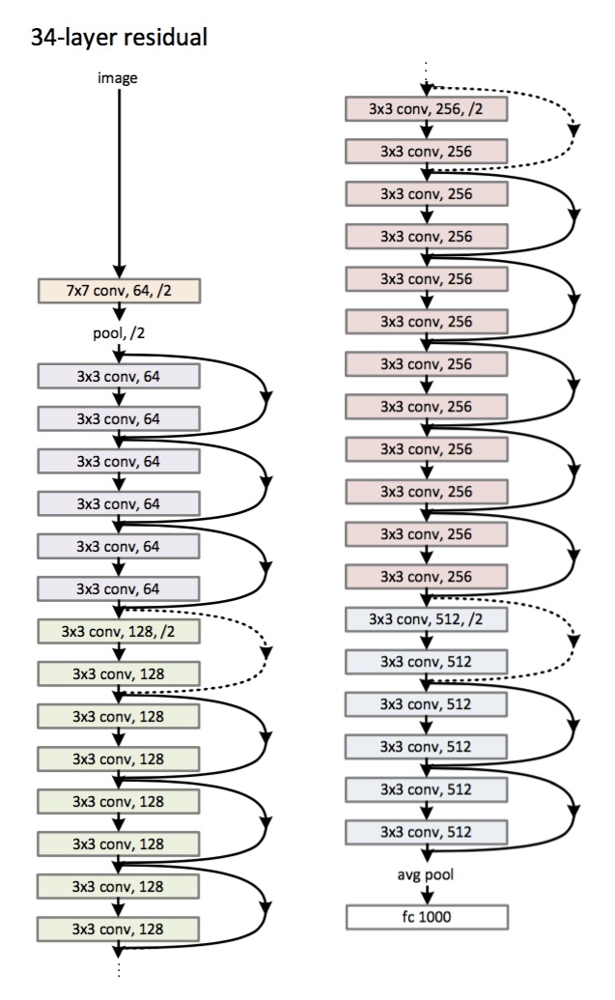

The original paper also stated that this type of residual network with 34 parameter layers has around 3.6 billion FLOPs. Given the theoretical peak of our GPU (~4.4 TFLOPS), we can do well over a thousand forward passes per second. Even though real training will be much slower, this still gives us enough headroom to not suffer too much of a slowdown given our GPU. Moving forward, we will present the full mathematical derivation of our training. Let $f_\theta : \mathbb{R}^{B \times 3 \times 256 \times 256} \rightarrow \mathbb{R}^{B \times 3}$ be a **ResNet-34** model with parameters $\theta$. For a batch $\mathbf{X}_\text{batch}$, we forward pass it through the network:

$$
\textbf{Z}_\text{batch} = f_\theta(\mathbf{X}_\text{batch}) \in \mathbb{R}^{B \times 3},
$$

where each row $\vec{z_b}$ corresponds to logits for the 3 classes for the $b$-th sample in the batch. Each residual block implements

$$
\mathbf{H}(\mathbf{x}) = \mathcal{F}(\mathbf{x}, \mathbf{W}) + \mathbf{x},
$$
where $\mathcal{F}$ is the series of convolutions, batch norms, and $\text{ReLU}$ activations with learnable weights $W$ and adding the input tensor $(+\mathbf{x})$ prevents vanishing gradients in deep networks. After flattening the feature tensor and mapping the linear layer to class logits, we apply **softmax** for the final prediction:

$$
\mathbf{\hat{Y}}_\text{batch} = \text{softmax}(\mathbf{Z}_\text{batch}) \iff \hat{Y}_i^{(c)} = \frac{e^{Z_i^{(c)}}}{\sum_j e^{Z_i^{(j)}}}, \quad c, j \in \{\text{urban, rural, uninhabited}\}.
$$

This ensures that predictions are valid probability distributions per tile. For soft labels, the cross-entropy loss is defined as

$$
\mathcal{L}^\text{batch}(\theta) = -\frac{1}{B} \sum_{i=1}^B \sum_{c=1}^3 Y_i^{(c)} \ln \hat{Y}_i^{(c)}.
$$
Minimizing cross-entropy is equivalent to minimizing KL divergence between predicted and true distributions. Next, we add L2 regularization to penalize large weights. Given that the network has $1 \leq l \leq L$ layers with weights $\mathbf{W}^{(l)}$ and biases $\mathbf{b^{(l)}}$:

$$
\mathcal{L}^\text{batch}_\text{reg}(\theta) = \mathcal{L}^\text{batch}(\theta) + \frac{\lambda}{2} \sum_{l=1}^L \big(||\mathbf{W}^{(l)}||^2_F + ||\mathbf{b}^{(l)}||^2_2 \big),
$$
where $\lambda$ is the weight decay hyperparameter and $||\cdot||_F$ is the Frobenius norm. Next, here is the batch gradient with respect to logits (before applying softmax):

$$
\frac{\partial \mathcal{L}^\text{batch}}{\partial \mathbf{Z}_\text{batch}} = \frac{\mathbf{\hat{Y}}_\text{batch} - \mathbf{Y}_\text{batch}}{B} \in \mathbb{R}^{B \times 3}.
$$

Using the chain rule, the gradient from the loss is for each parameter is
$$
\nabla_{\theta} \mathcal{L}^{\text{batch}} = \frac{\partial \mathcal{L}^\text{batch}}{\partial \mathbf{Z}_\text{batch}} \frac{\partial \mathbf{Z}_\text{batch}}{\partial \theta} + \lambda \theta.
$$
The parameter update task will be handled by the **Adaptive Moment Estimator** (Adam optimizer). For each parameter $\theta_t$ (weights or biases), it keeps two running estimates:
1. First moment (**mean of gradients**)

$$
\mathbf{m}_t = \beta_1\mathbf{m}_{t-1} + (1 - \beta_1) \nabla_\theta \mathcal{L}^\text{batch}_\text{reg}
$$

2. Second moment (**uncentered variance of gradients**):

$$
\mathbf{v}_t = \beta_2\mathbf{v}_{t-1} + (1 - \beta_2) \nabla^2_\theta \mathcal{L}^\text{batch}_\text{reg}
$$

$\beta_1, \beta_2$ are decay rates (commonly 0.9, 0.999). To correct for initialization bias:

$$
\mathbf{\hat{m}}_t = \frac{\mathbf{m}_t}{1 - \beta^t_1},
$$$$
\mathbf{\hat{v}}_t = \frac{\mathbf{v}_t}{1 - \beta^t_2}.
$$

This ensures estimates are unbiased in early steps. Finally, the parameter update rule is 

$$
\theta_{t+1} \gets \theta_t - \eta \frac{\mathbf{\hat{m}}_t}{\sqrt{\mathbf{\hat{v}}_t} + \epsilon},
$$

where $\eta$ is the learning rate and $\epsilon \approx 10^{-8}$ prevents division by zero. This above derivation represents the process of one entire training phase. Next, we employ a $K = 5$ fold cross-validation selection scheme. For this model, we select a hyperparameter grid that consists of the learning rate, weight decay, and dropout rate: $\Lambda \in \{\eta, \lambda, p\}$. In this process, we split into $K$ folds: $\bigcup_{k=1}^K \mathcal{D}_k$, then train on $\mathcal{D}^\text{train}_k$ and validate on $\mathcal{D}^\text{test}_k$:

$$
\theta^{(k, \Lambda)} = \arg \min_\theta \frac{1}{|\mathcal{D}^\text{train}_k|} \sum_{i \in \mathcal{D}^\text{train}_k} \mathcal{L}_\text{reg}^{(i)}(\theta).
$$

Compute vectorized validation loss per fold:

$$
\mathcal{L}_\text{test}^{(k, \Lambda)} = \frac{1}{|\mathcal{D}^\text{test}_k|} \sum_{i \in \mathcal{D}^\text{test}_k} \mathcal{L}^{(i)} (\theta^{(k, \Lambda)}).
$$

Average over folds to select optimal hyperparameters:

$$
\bar{\mathcal{L}}_\text{test}(\Lambda) = K^{-1} \sum_{k=1}^K \mathcal{L}_\text{test}^{(k, \Lambda)}
$$$$
\implies \Lambda^* = \arg \min_\Lambda \bar{\mathcal{L}}_\text{test}(\Lambda).
$$

In [7]:
batch_size = 32 # adjust for GPU VRAM
num_epochs = 3 # adjust for training length

# hyperparameter grid
learning_rates = [1e-4, 5e-4, 1e-3]
weight_decays = [1e-5, 1e-4, 1e-3]
dropout_rates = [0.2, 0.5]

kf = KFold(shuffle=True) # default k = 5
best_loss = float("inf")
best_params = None

for lr in learning_rates:
    for wd in weight_decays:
        for dr in dropout_rates:
            fold_losses = []
            for fold, (train_idx, test_idx) in enumerate(kf.split(dataset)):
                model = models.resnet34(weights=None)
                in_features = model.fc.in_features
                model.fc = nn.Sequential(nn.Dropout(p=dr), nn.Linear(in_features, 3))
                model = model.to(device)
                optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=wd)

                train_subset = Subset(dataset, train_idx)
                test_subset = Subset(dataset, test_idx)

                # Compute weights for oversampling
                train_labels = [dataset[i][1].argmax().item() for i in train_idx]
                class_counts = Counter(train_labels)
                num_samples = len(train_labels)
                class_weights = {cls: num_samples / count for cls, count in class_counts.items()}
                sample_weights = [class_weights[label] for label in train_labels]
                sampler = WeightedRandomSampler(sample_weights, num_samples=num_samples, replacement=True)

                train_loader = DataLoader(train_subset, batch_size=batch_size, sampler=sampler, num_workers=4)
                test_loader = DataLoader(test_subset, batch_size=batch_size, shuffle=False, num_workers=4)

                for epoch in range(num_epochs):
                    model.train()
                    for X, y_soft in tqdm(train_loader, desc=f"(η, λ, p) = {lr,wd,dr} | Fold {fold+1}/5, Epoch {epoch+1}/{num_epochs}"):
                        X, y_soft = X.to(device), y_soft.to(device)
                        optimizer.zero_grad()
                        logits = model(X)
                        log_probs = F.log_softmax(logits, dim=1)
                        loss = -(y_soft * log_probs).sum(dim=1).mean()
                        loss.backward()
                        optimizer.step()

                # Validation
                model.eval()
                test_loss = 0.0
                with torch.no_grad():
                    for X, y_soft in test_loader:
                        X, y_soft = X.to(device), y_soft.to(device)
                        logits = model(X)
                        log_probs = F.log_softmax(logits, dim=1)
                        loss = -(y_soft * log_probs).sum(dim=1).mean()
                        test_loss += loss.item() * X.size(0)

                test_loss /= len(test_subset)
                fold_losses.append(test_loss)

            avg_test_loss = np.mean(fold_losses)
            if avg_test_loss < best_loss:
                best_loss = avg_test_loss
                best_params = (lr, wd, dr)

print(f"\nBest hyperparameters: η* = {best_params[0]}, λ* = {best_params[1]}, p* = {best_params[2]} with lowest average validation loss = {best_loss:.4f}")

(η, λ, p) = (0.0001, 1e-05, 0.2) | Fold 1/5, Epoch 1/3: 100%|█████████████████████████| 762/762 [03:10<00:00,  4.00it/s]
(η, λ, p) = (0.0001, 1e-05, 0.2) | Fold 1/5, Epoch 2/3: 100%|█████████████████████████| 762/762 [03:10<00:00,  4.00it/s]
(η, λ, p) = (0.0001, 1e-05, 0.2) | Fold 1/5, Epoch 3/3: 100%|█████████████████████████| 762/762 [03:10<00:00,  4.01it/s]
(η, λ, p) = (0.0001, 1e-05, 0.2) | Fold 2/5, Epoch 1/3: 100%|█████████████████████████| 762/762 [03:10<00:00,  4.01it/s]
(η, λ, p) = (0.0001, 1e-05, 0.2) | Fold 2/5, Epoch 2/3: 100%|█████████████████████████| 762/762 [03:09<00:00,  4.01it/s]
(η, λ, p) = (0.0001, 1e-05, 0.2) | Fold 2/5, Epoch 3/3: 100%|█████████████████████████| 762/762 [03:10<00:00,  4.01it/s]
(η, λ, p) = (0.0001, 1e-05, 0.2) | Fold 3/5, Epoch 1/3: 100%|█████████████████████████| 762/762 [03:09<00:00,  4.03it/s]
(η, λ, p) = (0.0001, 1e-05, 0.2) | Fold 3/5, Epoch 2/3: 100%|█████████████████████████| 762/762 [03:09<00:00,  4.02it/s]
(η, λ, p) = (0.0001, 1e-05, 0.2)


Best hyperparameters: η* = 0.0001, λ* = 1e-05, p* = 0.2 with lowest average validation loss = 0.3195


In the K-fold cross validation procedure above, we oversample the minority datasets to account for class imbalance. Finally, $\forall \eta^*, \lambda^*, p^* \in \Lambda^*$, we can plug them into a final **ResNet-34** network to get the best model after final re-training:

In [12]:
N_train = int(0.8 * len(dataset))
N_test = len(dataset) - N_train 
train_dataset, test_dataset = random_split(dataset, [N_train, N_test])

best_eta = best_params[0] # learning rate
best_lambda = best_params[1] # weight decay
best_dropout = best_params[2] 

train_labels = [y_soft.argmax().item() for _, y_soft in train_dataset]
class_counts = Counter(train_labels)
num_samples = len(train_labels)
class_weights = {cls: num_samples / count for cls, count in class_counts.items()}
sample_weights = [class_weights[label] for label in train_labels]
sampler = WeightedRandomSampler(weights=sample_weights, num_samples=num_samples, replacement=True)
train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, num_workers=4)

best_model = models.resnet34(weights=None)
in_features = best_model.fc.in_features
best_model.fc = nn.Sequential(nn.Dropout(p=best_dropout), nn.Linear(in_features, 3))
best_model = best_model.to(device)

optimizer = optim.Adam(best_model.parameters(), lr=best_eta, weight_decay=best_lambda)
epochs = 30
best_model.train()

for epoch in range(epochs):
    for X, y_soft in tqdm(train_loader, desc=f"Final Training Epoch {epoch+1}/{epochs}"):
        X, y_soft = X.to(device), y_soft.to(device)
        optimizer.zero_grad()
        logits = best_model(X)
        log_probs = F.log_softmax(logits, dim=1)
        loss = -(y_soft * log_probs).sum(dim=1).mean()
        loss.backward()
        optimizer.step()

Final Training Epoch 30/30: 100%|█████████████████████████████████████████████████████| 762/762 [03:11<00:00,  3.98it/s]


## Evaluation
We can now see how well it performs by evaluating it on the following metrics:
- Accuracy (the higher the better)
- Macro Precision (the higher the better)
- Macro Recall (the higher the better)
- Macro F1 Score (the higher the better)

In [22]:
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
best_model.eval()
total_loss = 0.0

all_preds = []
all_targets = []
all_true_soft = []
y_pred_probs = []

with torch.no_grad():
    for X, y_soft in tqdm(test_loader, desc=f"Final Evaluation"):
        X, y_soft = X.to(device), y_soft.to(device)
        logits = best_model(X)
        log_probs = F.log_softmax(logits, dim=1)

        loss = -(y_soft * log_probs).sum(dim=1).mean()
        total_loss += loss.item() * X.size(0)
        
        probs = torch.softmax(logits, dim=1)
        preds = torch.argmax(logits, dim=1)  # predicted class
        targets = torch.argmax(y_soft, dim=1)  # true class from soft label
        
        y_pred_probs.append(probs.cpu())
        all_preds.extend(preds.cpu().numpy())
        all_targets.extend(targets.cpu().numpy())
        all_true_soft.append(y_soft.cpu())

avg_loss = total_loss / len(test_dataset)
y_pred_probs = torch.cat(y_pred_probs, dim=0)
y_true_soft = torch.cat(all_true_soft, dim=0)
print(f"\nFinal average validation loss: {avg_loss:.4f}")

acc = accuracy_score(all_targets, all_preds)
prec = precision_score(all_targets, all_preds, average='macro')
rec = recall_score(all_targets, all_preds, average='macro')
f1 = f1_score(all_targets, all_preds, average='macro')

print(f"Accuracy: {acc:.4f}")
print(f"Macro Precision: {prec:.4f}")
print(f"Macro Recall: {rec:.4f}")
print(f"Macro F1: {f1:.4f}")

Final Evaluation: 100%|███████████████████████████████████████████████████████████████| 191/191 [00:23<00:00,  7.96it/s]


Final average validation loss: 0.3172
Accuracy: 0.9629
Macro Precision: 0.6965
Macro Recall: 0.5074
Macro F1: 0.5653


We can get the confusion matrix of the model...

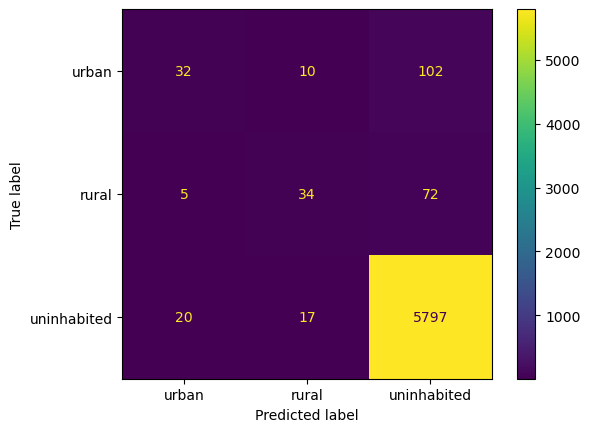

In [23]:
classes = ["urban", "rural", "uninhabited"]
cm = confusion_matrix(all_targets, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
disp.plot()

...and visualize the model's top predictions on some satellite tiles:

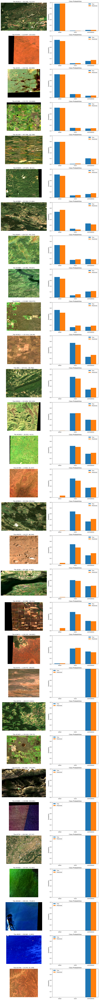

In [24]:
num_classes = y_pred_probs.shape[1]
y_true = torch.tensor(all_targets)
y_pred_classes = y_pred_probs.argmax(dim=1)
selected_indices = []
top_n = 10

for cls in range(num_classes):
    cls_correct = ((y_pred_classes == y_true) & (y_true == cls)).nonzero(as_tuple=True)[0]
    cls_conf = y_pred_probs[cls_correct, cls]
    top_cls = cls_correct[torch.argsort(cls_conf, descending=True)][:top_n] # show the top few (adjustable)
    selected_indices.append(top_cls)

selected_indices = torch.cat(selected_indices).cpu().tolist()
fig, axes = plt.subplots(len(selected_indices), 2, figsize=(12, 4 * len(selected_indices)))

for row, i in enumerate(selected_indices):
    with rasterio.open(f"HLS2-s30_rgb/tile{i}.tif") as src:
        img = src.read([1, 2, 3]).astype(np.float32)
        img /= np.percentile(img, 99)
        img = np.clip(img, 0, 1)
        height, width = img.shape[1], img.shape[2]
        center_x, center_y = src.transform * (height // 2, height // 2)
        center_x, center_y = round(center_x, 3), round(center_y, 3)
        axes[row, 0].imshow(img.transpose(1, 2, 0))
        axes[row, 0].set_title(f"Tile #{i} — ({center_y}, {center_x})")
        axes[row, 0].axis("off")
        pred_probs = y_pred_probs[i].cpu().numpy()
        true_probs = y_true_soft[i].cpu().numpy()
        x = np.arange(num_classes)
        axes[row, 1].bar(x - .35/2, true_probs, .35, label="True")
        axes[row, 1].bar(x + .35/2, pred_probs, .35, label="Predicted")
        axes[row, 1].set_xticks(x)
        axes[row, 1].set_xticklabels(classes)
        axes[row, 1].set_ylim(0, 1)
        axes[row, 1].set_ylabel("Probability")
        axes[row, 1].legend()
        axes[row, 1].set_title("Class Probabilities")

plt.tight_layout()
plt.show()